In [425]:
# Loding the Libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.manifold import TSNE
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook
output_notebook()


Loading BokehJS ...

In [342]:
# Loading the dataset

data = pd.read_csv(r"C:\Users\Shashi\Model Building\Text Modeling 2\Data.csv")

In [343]:
# Importing the Warnings

import warnings
warnings.filterwarnings('ignore')

In [344]:
# Checking the data info

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14640 entries, 0 to 14639
Data columns (total 6 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   tweet_id        14640 non-null  int64 
 1   sentiment       14640 non-null  object
 2   text            14640 non-null  object
 3   tweet_created   14640 non-null  object
 4   tweet_location  9907 non-null   object
 5   user_timezone   9820 non-null   object
dtypes: int64(1), object(5)
memory usage: 686.4+ KB


In [345]:
# Checking the head of data

data.head()

,tweet_id,sentiment,text,tweet_created,tweet_location,user_timezone
0,1,neutral,What @dhepburn said.,24/02/2015 11:35,NaN,Eastern Time (US & Canada)
1,2,positive,plus you've added commercials to the experienc...,24/02/2015 11:15,NaN,Pacific Time (US & Canada)
2,3,neutral,I didn't today... Must mean I need to take ano...,24/02/2015 11:15,Lets Play,Central Time (US & Canada)
3,4,negative,"it's really aggressive to blast obnoxious ""ent...",24/02/2015 11:15,NaN,Pacific Time (US & Canada)
4,5,negative,and it's a really big bad thing about it,24/02/2015 11:14,NaN,Pacific Time (US & Canada)


In [346]:
data = data.iloc[:,2:3]

In [347]:
data = pd.DataFrame(data)

In [348]:
data

,text
0,What @dhepburn said.
1,plus you've added commercials to the experienc...
2,I didn't today... Must mean I need to take ano...
3,"it's really aggressive to blast obnoxious ""ent..."
4,and it's a really big bad thing about it
...,...
14635,thank you we got on a different flight to Chic...
14636,leaving over 20 minutes Late Flight. No warnin...
14637,Please bring American Airlines to #BlackBerry10
14638,"you have my money, you change my flight, and d..."


In [349]:
# Squeeze -> scalars

data = data.squeeze()

In [350]:
# Lowercase text

series_lower = data.apply(lambda x: x.lower())
print(series_lower)

0                                     what @dhepburn said.
1        plus you've added commercials to the experienc...
2        i didn't today... must mean i need to take ano...
3        it's really aggressive to blast obnoxious "ent...
4                 and it's a really big bad thing about it
                               ...                        
14635    thank you we got on a different flight to chic...
14636    leaving over 20 minutes late flight. no warnin...
14637      please bring american airlines to #blackberry10
14638    you have my money, you change my flight, and d...
14639    we have 8 ppl so we need 2 know how many seats...
Name: text, Length: 14640, dtype: object


In [351]:
# Removing Casefold

series_casefold = data.apply(lambda x: x.casefold())
print(series_casefold)

0                                     what @dhepburn said.
1        plus you've added commercials to the experienc...
2        i didn't today... must mean i need to take ano...
3        it's really aggressive to blast obnoxious "ent...
4                 and it's a really big bad thing about it
                               ...                        
14635    thank you we got on a different flight to chic...
14636    leaving over 20 minutes late flight. no warnin...
14637      please bring american airlines to #blackberry10
14638    you have my money, you change my flight, and d...
14639    we have 8 ppl so we need 2 know how many seats...
Name: text, Length: 14640, dtype: object


In [352]:
# Removing punctuation

series_casefold = series_casefold.apply(lambda x: x.translate(str.maketrans('','', string.punctuation)))

In [353]:
# Removing the numbers

series_casefold = series_casefold.apply(lambda x: x.translate(str.maketrans('','', string.digits)))

In [354]:
series_casefold 

0                                       what dhepburn said
1        plus youve added commercials to the experience...
2        i didnt today must mean i need to take another...
3        its really aggressive to blast obnoxious enter...
4                  and its a really big bad thing about it
                               ...                        
14635    thank you we got on a different flight to chicago
14636    leaving over  minutes late flight no warnings ...
14637         please bring american airlines to blackberry
14638    you have my money you change my flight and don...
14639    we have  ppl so we need  know how many seats a...
Name: text, Length: 14640, dtype: object

In [362]:
# remove white spaces

series_casefold = series_casefold.str.strip()
print(series_casefold)

0                                       what dhepburn said
1        plus youve added commercials to the experience...
2        i didnt today must mean i need to take another...
3        its really aggressive to blast obnoxious enter...
4                  and its a really big bad thing about it
                               ...                        
14635    thank you we got on a different flight to chicago
14636    leaving over  minutes late flight no warnings ...
14637         please bring american airlines to blackberry
14638    you have my money you change my flight and don...
14639    we have  ppl so we need  know how many seats a...
Name: text, Length: 14640, dtype: object


In [363]:
data = series_casefold

In [364]:
series_casefold

0                                       what dhepburn said
1        plus youve added commercials to the experience...
2        i didnt today must mean i need to take another...
3        its really aggressive to blast obnoxious enter...
4                  and its a really big bad thing about it
                               ...                        
14635    thank you we got on a different flight to chicago
14636    leaving over  minutes late flight no warnings ...
14637         please bring american airlines to blackberry
14638    you have my money you change my flight and don...
14639    we have  ppl so we need  know how many seats a...
Name: text, Length: 14640, dtype: object

In [365]:
# Word Tokenizer

token_data = [word_tokenize(word) for word in data]
print(token_data)

[['what', 'dhepburn', 'said'], ['plus', 'youve', 'added', 'commercials', 'to', 'the', 'experience', 'tacky'], ['i', 'didnt', 'today', 'must', 'mean', 'i', 'need', 'to', 'take', 'another', 'trip'], ['its', 'really', 'aggressive', 'to', 'blast', 'obnoxious', 'entertainment', 'in', 'your', 'guests', 'faces', 'amp', 'they', 'have', 'little', 'recourse'], ['and', 'its', 'a', 'really', 'big', 'bad', 'thing', 'about', 'it'], ['seriously', 'would', 'pay', 'a', 'flight', 'for', 'seats', 'that', 'didnt', 'have', 'this', 'playing', 'its', 'really', 'the', 'only', 'bad', 'thing', 'about', 'flying', 'va'], ['yes', 'nearly', 'every', 'time', 'i', 'fly', 'vx', 'this', 'ar', 'worm', 'won', 'go', 'away'], ['really', 'missed', 'a', 'prime', 'opportunity', 'for', 'men', 'without', 'hats', 'parody', 'there', 'httpstcomwpggrezp'], ['well', 'i', 'didntbut', 'now', 'i', 'do', 'd'], ['it', 'was', 'amazing', 'and', 'arrived', 'an', 'hour', 'early', 'youre', 'too', 'good', 'to', 'me'], ['did', 'you', 'know', 't

In [366]:
# Sentence Tokenizer

from nltk.tokenize import sent_tokenize

sent_token = [sent_tokenize(doc) for doc in data]
print(sent_token)

[['what dhepburn said'], ['plus youve added commercials to the experience tacky'], ['i didnt today must mean i need to take another trip'], ['its really aggressive to blast obnoxious entertainment in your guests faces amp they have little recourse'], ['and its a really big bad thing about it'], ['seriously would pay  a flight for seats that didnt have this playing\nits really the only bad thing about flying va'], ['yes nearly every time i fly vx this ar worm won go away'], ['really missed a prime opportunity for men without hats parody there httpstcomwpggrezp'], ['well i didntbut now i do d'], ['it was amazing and arrived an hour early youre too good to me'], ['did you know that suicide is the second leading cause of death among teens'], ['i lt pretty graphics so much better than minimal iconography d'], ['this is such a great deal already thinking about my nd trip to australia amp i havent even gone on my st trip yet p'], ['virginmedia im flying your fabulous seductive skies again u t

In [367]:
# Punctuation Removal

import re

regex = re.compile('[%s]' % re.escape(string.punctuation))

tokenized_data_no_punctuation = []

for comments in token_data:
    new_comments = []
    for token in comments:
        new_token = regex.sub(u'', token)
        if not new_token == u'':
            new_comments.append(new_token)
            
    tokenized_data_no_punctuation.append(new_comments)
    
print(tokenized_data_no_punctuation)



[['what', 'dhepburn', 'said'], ['plus', 'youve', 'added', 'commercials', 'to', 'the', 'experience', 'tacky'], ['i', 'didnt', 'today', 'must', 'mean', 'i', 'need', 'to', 'take', 'another', 'trip'], ['its', 'really', 'aggressive', 'to', 'blast', 'obnoxious', 'entertainment', 'in', 'your', 'guests', 'faces', 'amp', 'they', 'have', 'little', 'recourse'], ['and', 'its', 'a', 'really', 'big', 'bad', 'thing', 'about', 'it'], ['seriously', 'would', 'pay', 'a', 'flight', 'for', 'seats', 'that', 'didnt', 'have', 'this', 'playing', 'its', 'really', 'the', 'only', 'bad', 'thing', 'about', 'flying', 'va'], ['yes', 'nearly', 'every', 'time', 'i', 'fly', 'vx', 'this', 'ar', 'worm', 'won', 'go', 'away'], ['really', 'missed', 'a', 'prime', 'opportunity', 'for', 'men', 'without', 'hats', 'parody', 'there', 'httpstcomwpggrezp'], ['well', 'i', 'didntbut', 'now', 'i', 'do', 'd'], ['it', 'was', 'amazing', 'and', 'arrived', 'an', 'hour', 'early', 'youre', 'too', 'good', 'to', 'me'], ['did', 'you', 'know', 't

In [368]:
# Removing Stopwords

from nltk.corpus import stopwords

tokenized_data_no_stopwords = []

for docs in tokenized_data_no_punctuation:
    new_term_vector = []
    for word in docs:
        if not word in stopwords.words('english'):
            new_term_vector.append(word)
            
    tokenized_data_no_stopwords.append(new_term_vector)
    
print(tokenized_data_no_stopwords)

[['dhepburn', 'said'], ['plus', 'youve', 'added', 'commercials', 'experience', 'tacky'], ['didnt', 'today', 'must', 'mean', 'need', 'take', 'another', 'trip'], ['really', 'aggressive', 'blast', 'obnoxious', 'entertainment', 'guests', 'faces', 'amp', 'little', 'recourse'], ['really', 'big', 'bad', 'thing'], ['seriously', 'would', 'pay', 'flight', 'seats', 'didnt', 'playing', 'really', 'bad', 'thing', 'flying', 'va'], ['yes', 'nearly', 'every', 'time', 'fly', 'vx', 'ar', 'worm', 'go', 'away'], ['really', 'missed', 'prime', 'opportunity', 'men', 'without', 'hats', 'parody', 'httpstcomwpggrezp'], ['well', 'didntbut'], ['amazing', 'arrived', 'hour', 'early', 'youre', 'good'], ['know', 'suicide', 'second', 'leading', 'cause', 'death', 'among', 'teens'], ['lt', 'pretty', 'graphics', 'much', 'better', 'minimal', 'iconography'], ['great', 'deal', 'already', 'thinking', 'nd', 'trip', 'australia', 'amp', 'havent', 'even', 'gone', 'st', 'trip', 'yet', 'p'], ['virginmedia', 'im', 'flying', 'fabulou

In [369]:
# Punctuation Removal

import re

regex = re.compile('[%s]' % re.escape(string.punctuation))

tokenized_data_no_punctuation = []

for comments in token_data:
    new_comments = []
    for token in comments:
        new_token = regex.sub(u'', token)
        if not new_token == u'':
            new_comments.append(new_token)
            
    tokenized_data_no_punctuation.append(new_comments)
    
print(tokenized_data_no_punctuation)



[['what', 'dhepburn', 'said'], ['plus', 'youve', 'added', 'commercials', 'to', 'the', 'experience', 'tacky'], ['i', 'didnt', 'today', 'must', 'mean', 'i', 'need', 'to', 'take', 'another', 'trip'], ['its', 'really', 'aggressive', 'to', 'blast', 'obnoxious', 'entertainment', 'in', 'your', 'guests', 'faces', 'amp', 'they', 'have', 'little', 'recourse'], ['and', 'its', 'a', 'really', 'big', 'bad', 'thing', 'about', 'it'], ['seriously', 'would', 'pay', 'a', 'flight', 'for', 'seats', 'that', 'didnt', 'have', 'this', 'playing', 'its', 'really', 'the', 'only', 'bad', 'thing', 'about', 'flying', 'va'], ['yes', 'nearly', 'every', 'time', 'i', 'fly', 'vx', 'this', 'ar', 'worm', 'won', 'go', 'away'], ['really', 'missed', 'a', 'prime', 'opportunity', 'for', 'men', 'without', 'hats', 'parody', 'there', 'httpstcomwpggrezp'], ['well', 'i', 'didntbut', 'now', 'i', 'do', 'd'], ['it', 'was', 'amazing', 'and', 'arrived', 'an', 'hour', 'early', 'youre', 'too', 'good', 'to', 'me'], ['did', 'you', 'know', 't

In [370]:
# Stemming and Lemmatization

from nltk.stem.porter import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

porter = PorterStemmer()
wordnet = WordNetLemmatizer()

preprocessed_docs = []

for docs in tokenized_data_no_stopwords:
    final_doc = []
    for word in docs:
        #final_doc.append(porter.stem(word))
        final_doc.append(wordnet.lemmatize(word))
        
    preprocessed_docs.append(final_doc)
    
print(preprocessed_docs)

[['dhepburn', 'said'], ['plus', 'youve', 'added', 'commercial', 'experience', 'tacky'], ['didnt', 'today', 'must', 'mean', 'need', 'take', 'another', 'trip'], ['really', 'aggressive', 'blast', 'obnoxious', 'entertainment', 'guest', 'face', 'amp', 'little', 'recourse'], ['really', 'big', 'bad', 'thing'], ['seriously', 'would', 'pay', 'flight', 'seat', 'didnt', 'playing', 'really', 'bad', 'thing', 'flying', 'va'], ['yes', 'nearly', 'every', 'time', 'fly', 'vx', 'ar', 'worm', 'go', 'away'], ['really', 'missed', 'prime', 'opportunity', 'men', 'without', 'hat', 'parody', 'httpstcomwpggrezp'], ['well', 'didntbut'], ['amazing', 'arrived', 'hour', 'early', 'youre', 'good'], ['know', 'suicide', 'second', 'leading', 'cause', 'death', 'among', 'teen'], ['lt', 'pretty', 'graphic', 'much', 'better', 'minimal', 'iconography'], ['great', 'deal', 'already', 'thinking', 'nd', 'trip', 'australia', 'amp', 'havent', 'even', 'gone', 'st', 'trip', 'yet', 'p'], ['virginmedia', 'im', 'flying', 'fabulous', 'se

In [371]:
preprocessed_docs =  data

In [380]:
# POS Tagging 

import nltk
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Shashi\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\Shashi\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping taggers\averaged_perceptron_tagger.zip.


True

In [381]:
tokens = nltk.word_tokenize(str(data))

In [382]:
tokens

['0',
 'what',
 'dhepburn',
 'said',
 '1',
 'plus',
 'youve',
 'added',
 'commercials',
 'to',
 'the',
 'experience',
 '...',
 '2',
 'i',
 'didnt',
 'today',
 'must',
 'mean',
 'i',
 'need',
 'to',
 'take',
 'another',
 '...',
 '3',
 'its',
 'really',
 'aggressive',
 'to',
 'blast',
 'obnoxious',
 'enter',
 '...',
 '4',
 'and',
 'its',
 'a',
 'really',
 'big',
 'bad',
 'thing',
 'about',
 'it',
 '...',
 '14635',
 'thank',
 'you',
 'we',
 'got',
 'on',
 'a',
 'different',
 'flight',
 'to',
 'chicago',
 '14636',
 'leaving',
 'over',
 'minutes',
 'late',
 'flight',
 'no',
 'warnings',
 '...',
 '14637',
 'please',
 'bring',
 'american',
 'airlines',
 'to',
 'blackberry',
 '14638',
 'you',
 'have',
 'my',
 'money',
 'you',
 'change',
 'my',
 'flight',
 'and',
 'don',
 '...',
 '14639',
 'we',
 'have',
 'ppl',
 'so',
 'we',
 'need',
 'know',
 'how',
 'many',
 'seats',
 'a',
 '...',
 'Name',
 ':',
 'text',
 ',',
 'Length',
 ':',
 '14640',
 ',',
 'dtype',
 ':',
 'object']

In [383]:
tagged = nltk.pos_tag(tokens)


In [384]:
tagged

[('0', 'CD'),
 ('what', 'WP'),
 ('dhepburn', 'NN'),
 ('said', 'VBD'),
 ('1', 'CD'),
 ('plus', 'CC'),
 ('youve', 'NN'),
 ('added', 'JJ'),
 ('commercials', 'NNS'),
 ('to', 'TO'),
 ('the', 'DT'),
 ('experience', 'NN'),
 ('...', ':'),
 ('2', 'CD'),
 ('i', 'NN'),
 ('didnt', 'NN'),
 ('today', 'NN'),
 ('must', 'MD'),
 ('mean', 'VB'),
 ('i', 'NNS'),
 ('need', 'VBP'),
 ('to', 'TO'),
 ('take', 'VB'),
 ('another', 'DT'),
 ('...', ':'),
 ('3', 'CD'),
 ('its', 'PRP$'),
 ('really', 'RB'),
 ('aggressive', 'JJ'),
 ('to', 'TO'),
 ('blast', 'VB'),
 ('obnoxious', 'JJ'),
 ('enter', 'NN'),
 ('...', ':'),
 ('4', 'CD'),
 ('and', 'CC'),
 ('its', 'PRP$'),
 ('a', 'DT'),
 ('really', 'RB'),
 ('big', 'JJ'),
 ('bad', 'JJ'),
 ('thing', 'NN'),
 ('about', 'IN'),
 ('it', 'PRP'),
 ('...', ':'),
 ('14635', 'CD'),
 ('thank', 'NN'),
 ('you', 'PRP'),
 ('we', 'PRP'),
 ('got', 'VBD'),
 ('on', 'IN'),
 ('a', 'DT'),
 ('different', 'JJ'),
 ('flight', 'NN'),
 ('to', 'TO'),
 ('chicago', 'VB'),
 ('14636', 'CD'),
 ('leaving', 'VBG'),

In [378]:
df

,aa,aaaand,aaadvantage,aaalwayslate,aaba,aacom,aacustomerservice,aadavantage,aadelay,aadfw,...,zkatcher,zombie,zone,zones,zoom,zrh,zrhairport,zukes,zurich,zurichnew
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14635,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
14636,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
14637,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
14638,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [387]:
# NER - Named Entities Recognition 

import spacy
import en_core_web_sm
nlp = spacy.load('en_core_web_sm')
 
FoundEntities=nlp(str(data))

for X in FoundEntities.ents:
    print([(X.text, X.label_)])

[('0                                       ', 'DATE')]
[('dhepburn', 'ORG')]
[('1', 'CARDINAL')]
[('today', 'DATE')]
[('3', 'CARDINAL')]
[('4                  ', 'PERCENT')]
[('chicago', 'GPE')]
[('14636', 'DATE')]
[('14637', 'DATE')]
[('american', 'NORP')]
[('14638', 'DATE')]
[('14639', 'DATE')]
[('Length', 'PERSON')]
[('14640', 'DATE')]


In [388]:
# NORP - NAtionalities or religious or political groups
# GPE - Countries, cities, states
# ORG - Companies, agencies, institutions, etc

In [389]:
# LSA - LDA (Latent Semantic Analysis & Latent Dirichlet Allocation)

In [391]:
small_count_vectorizer = CountVectorizer(stop_words='english', max_features=40000)
small_text_sample = data.sample(n=10000, random_state=0).values

print('Headline before vectorization: {}'.format(small_text_sample[123]))

small_document_term_matrix = small_count_vectorizer.fit_transform(small_text_sample)

print('Headline after vectorization: \n{}'.format(small_document_term_matrix[123]))

Headline before vectorization: as requested heres selfie somewhere over the rockys milehighselfieclub httptcoachoxkpjp
Headline after vectorization: 
  (0, 8471)	1
  (0, 4217)	1
  (0, 8960)	1
  (0, 8667)	1
  (0, 6646)	1
  (0, 4435)	1


In [392]:
n_topics = 8

In [394]:
# LSA

from sklearn.decomposition import TruncatedSVD

lsa_model = TruncatedSVD(n_components=n_topics)
lsa_topic_matrix = lsa_model.fit_transform(small_document_term_matrix)

In [402]:
keys = lsa_topic_matrix.argmax(axis=1).tolist()

In [403]:
keys

[1,
 7,
 0,
 1,
 1,
 0,
 1,
 0,
 7,
 5,
 1,
 1,
 6,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 7,
 0,
 1,
 0,
 4,
 0,
 0,
 1,
 1,
 1,
 2,
 1,
 1,
 0,
 1,
 1,
 5,
 1,
 0,
 5,
 1,
 1,
 1,
 0,
 1,
 0,
 0,
 0,
 7,
 1,
 7,
 1,
 6,
 1,
 4,
 6,
 0,
 0,
 7,
 1,
 4,
 4,
 1,
 1,
 1,
 4,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 1,
 0,
 1,
 7,
 1,
 1,
 6,
 1,
 1,
 1,
 0,
 5,
 1,
 1,
 1,
 5,
 1,
 6,
 6,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 5,
 5,
 1,
 1,
 6,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 2,
 1,
 0,
 1,
 4,
 1,
 1,
 0,
 1,
 1,
 6,
 4,
 1,
 1,
 1,
 1,
 1,
 0,
 6,
 1,
 1,
 1,
 1,
 4,
 2,
 5,
 1,
 1,
 7,
 0,
 1,
 1,
 1,
 0,
 4,
 5,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 2,
 1,
 1,
 1,
 6,
 1,
 1,
 1,
 1,
 0,
 1,
 0,
 1,
 5,
 1,
 1,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 1,
 4,
 6,
 2,
 0,
 0,
 1,
 7,
 5,
 4,
 1,
 0,
 7,
 1,
 7,
 0,
 1,
 0,
 0,
 1,
 7,
 0,
 1,
 4,
 4,
 0,
 1,
 7,
 1,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 4,
 1,
 1,
 0,
 5,
 6,
 1,
 1,
 1,
 1,
 1,


In [405]:
from collections import Counter

count_pairs = Counter(keys).items()
categories = [pair[0] for pair in count_pairs]
counts = [pair[1] for pair in count_pairs]
print(categories, counts)

[1, 7, 0, 5, 6, 4, 2, 3] [4516, 480, 2629, 642, 753, 551, 420, 9]


In [406]:
lsa_keys = get_keys(lsa_topic_matrix)
lsa_categories, lsa_counts = keys_to_counts(lsa_keys)

In [408]:
 def get_top_n_words(n, keys, document_term_matrix, count_vectorizer):
    
    top_word_indices = []
    for topic in range(n_topics):
        temp_vector_sum = 0
        for i in range(len(keys)):
            if keys[i] == topic:
                temp_vector_sum += document_term_matrix[i]
        temp_vector_sum = temp_vector_sum.toarray()
        top_n_word_indices = np.flip(np.argsort(temp_vector_sum)[0][-n:],0)
        top_word_indices.append(top_n_word_indices)   
    top_words = []
    for topic in top_word_indices:
        topic_words = []
        for index in topic:
            temp_word_vector = np.zeros((1,document_term_matrix.shape[1]))
            temp_word_vector[:,index] = 1
            the_word = count_vectorizer.inverse_transform(temp_word_vector)[0][0]
            topic_words.append(the_word.encode('ascii').decode('utf-8'))
        top_words.append(" ".join(topic_words))         
    return top_words

In [409]:
top_n_words_lsa = get_top_n_words(10, lsa_keys, small_document_term_matrix, small_count_vectorizer)

for i in range(len(top_n_words_lsa)):
    print("Topic {}: ".format(i+1), top_n_words_lsa[i])

Topic 1:  flight cancelled late flightled delayed help hours just time hold
Topic 2:  service customer help im need amp dont thank bag phone
Topic 3:  flights cancelled flightled flighted tomorrow help amp united phone flighting
Topic 4:  customer today lmfao prize lost vinyl flight tovery didntbut yesterday
Topic 5:  thanks just response great help guys reply getting got know
Topic 6:  just thank fleek fleets jetblue want got rt im time
Topic 7:  time plane gate delayed boarding delay ua amp flights wait
Topic 8:  hours hold hour waiting plane minutes delayed sitting ive min


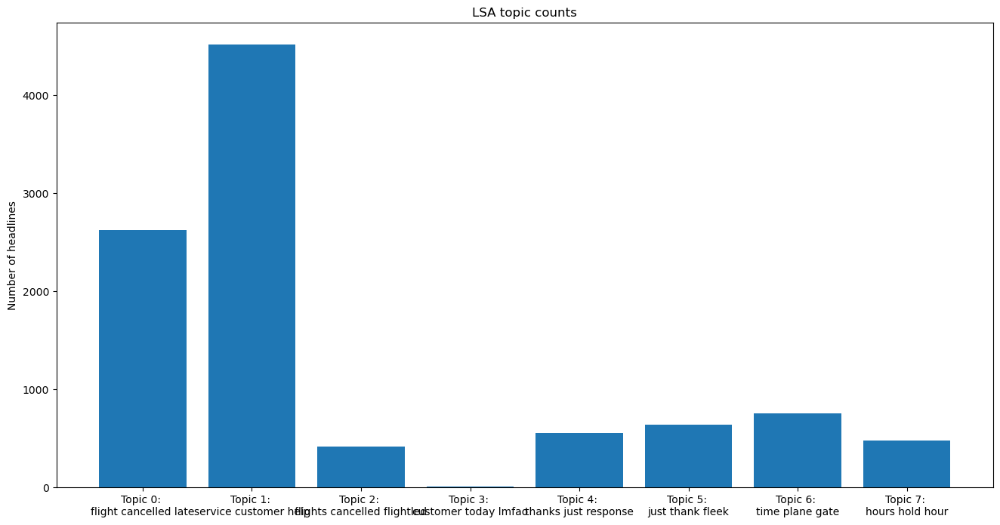

In [412]:
top_3_words = get_top_n_words(3, lsa_keys, small_document_term_matrix, small_count_vectorizer)
labels = ['Topic {}: \n'.format(i) + top_3_words[i] for i in lsa_categories]

fig, ax = plt.subplots(figsize=(16,8))
ax.bar(lsa_categories, lsa_counts);
ax.set_xticks(lsa_categories);
ax.set_xticklabels(labels);
ax.set_ylabel('Number of headlines');
ax.set_title('LSA topic counts');
plt.show()

In [415]:
tsne_lsa_model = TSNE(n_components=2, perplexity=50, learning_rate=100, 
                        n_iter=2000, verbose=1, random_state=0, angle=0.75)
tsne_lsa_vectors = tsne_lsa_model.fit_transform(lsa_topic_matrix)

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.020s...
[t-SNE] Computed neighbors for 10000 samples in 1.892s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 66.658127
[t-SNE] KL divergence after 2000 iterations: 0.871351


In [416]:
def get_mean_topic_vectors(keys, two_dim_vectors):
    '''
    returns a list of centroid vectors from each predicted topic category
    '''
    mean_topic_vectors = []
    for t in range(n_topics):
        articles_in_that_topic = []
        for i in range(len(keys)):
            if keys[i] == t:
                articles_in_that_topic.append(two_dim_vectors[i])    
        
        articles_in_that_topic = np.vstack(articles_in_that_topic)
        mean_article_in_that_topic = np.mean(articles_in_that_topic, axis=0)
        mean_topic_vectors.append(mean_article_in_that_topic)
    return mean_topic_vectors

In [417]:
colormap = np.array([
    "#1f77b4", "#aec7e8", "#ff7f0e", "#ffbb78", "#2ca02c",
    "#98df8a", "#d62728", "#ff9896", "#9467bd", "#c5b0d5",
    "#8c564b", "#c49c94", "#e377c2", "#f7b6d2", "#7f7f7f",
    "#c7c7c7", "#bcbd22", "#dbdb8d", "#17becf", "#9edae5" ])
colormap = colormap[:n_topics]

In [426]:
top_3_words_lsa = get_top_n_words(3, lsa_keys, small_document_term_matrix, small_count_vectorizer)
lsa_mean_topic_vectors = get_mean_topic_vectors(lsa_keys, tsne_lsa_vectors)

plot = figure(title="t-SNE Clustering of {} LSA Topics".format(n_topics), plot_width=700, plot_height=700)
plot.scatter(x=tsne_lsa_vectors[:,0], y=tsne_lsa_vectors[:,1], color=colormap[lsa_keys])

for t in range(n_topics):
    label = Label(x=lsa_mean_topic_vectors[t][0], y=lsa_mean_topic_vectors[t][1], 
                  text=top_3_words_lsa[t], text_color=colormap[t])
    plot.add_layout(label)
    
show(plot)

In [427]:
# LDA 

lda_model = LatentDirichletAllocation(n_components=n_topics, learning_method='online', 
                                          random_state=0, verbose=0)
lda_topic_matrix = lda_model.fit_transform(small_document_term_matrix)

In [428]:
lda_keys = get_keys(lda_topic_matrix)
lda_categories, lda_counts = keys_to_counts(lda_keys)

In [429]:
top_n_words_lda = get_top_n_words(10, lda_keys, small_document_term_matrix, small_count_vectorizer)

for i in range(len(top_n_words_lda)):
    print("Topic {}: ".format(i+1), top_n_words_lda[i])

Topic 1:  flight cancelled late flightled delayed help hours just time hold
Topic 2:  service customer help im need amp dont thank bag phone
Topic 3:  flights cancelled flightled flighted tomorrow help amp united phone flighting
Topic 4:  customer today lmfao prize lost vinyl flight tovery didntbut yesterday
Topic 5:  thanks just response great help guys reply getting got know
Topic 6:  just thank fleek fleets jetblue want got rt im time
Topic 7:  time plane gate delayed boarding delay ua amp flights wait
Topic 8:  hours hold hour waiting plane minutes delayed sitting ive min


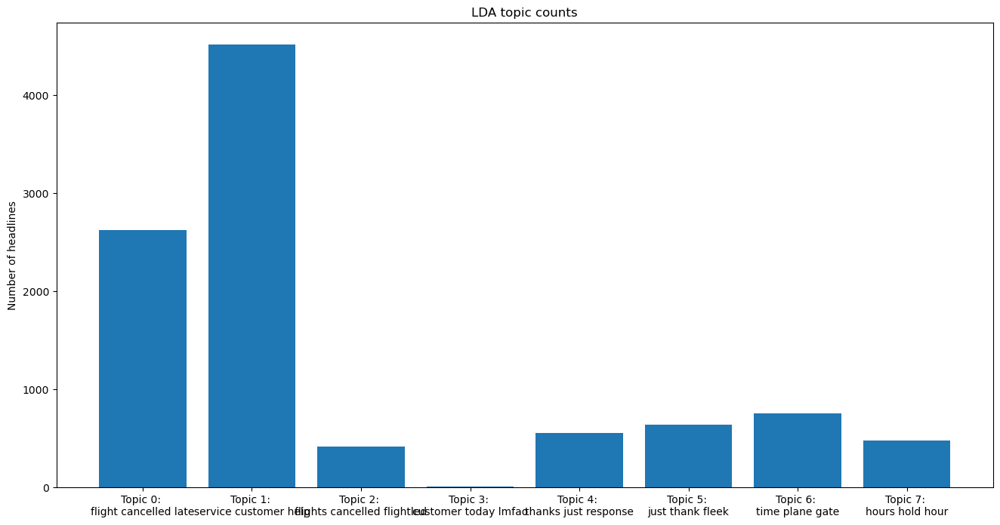

In [430]:
top_3_words = get_top_n_words(3, lda_keys, small_document_term_matrix, small_count_vectorizer)
labels = ['Topic {}: \n'.format(i) + top_3_words[i] for i in lda_categories]

fig, ax = plt.subplots(figsize=(16,8))
ax.bar(lda_categories, lda_counts);
ax.set_xticks(lda_categories);
ax.set_xticklabels(labels);
ax.set_title('LDA topic counts');
ax.set_ylabel('Number of headlines');

In [431]:
tsne_lda_model = TSNE(n_components=2, perplexity=50, learning_rate=100, 
                        n_iter=2000, verbose=1, random_state=0, angle=0.75)
tsne_lda_vectors = tsne_lda_model.fit_transform(lda_topic_matrix)

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.013s...
[t-SNE] Computed neighbors for 10000 samples in 2.485s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 82.762810
[t-SNE] KL divergence after 2000 iterations: 1.432053


In [432]:
top_3_words_lda = get_top_n_words(3, lda_keys, small_document_term_matrix, small_count_vectorizer)
lda_mean_topic_vectors = get_mean_topic_vectors(lda_keys, tsne_lda_vectors)

plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), plot_width=700, plot_height=700)
plot.scatter(x=tsne_lda_vectors[:,0], y=tsne_lda_vectors[:,1], color=colormap[lda_keys])

for t in range(n_topics):
    label = Label(x=lda_mean_topic_vectors[t][0], y=lda_mean_topic_vectors[t][1], 
                  text=top_3_words_lda[t], text_color=colormap[t])
    plot.add_layout(label)

show(plot)